# Метод Фурье. 

Начальное отклонение конечной струны $f(x)$ задано на отрезке $[0,l]$, а начальная скорость 

$$
   g(x) = \left\{  \begin{matrix} c & , если & x \in [\alpha, \beta] \\ 0 & , если & x \in [0, \alpha) \cap (\beta, l] \end{matrix}  \right.
$$

Вариант №10

$$f(x)=(l-x)\sqrt{x}, c=1$$
$$l=0.8,  \rho=0.02,  N=0.05,  \alpha=0.39,  \beta=0.41$$


# Задание 1

$f(x, t_0 = 0)$  и  $g(x, t_0 = 0)$

$f(x, t_0) = (0.8 - x)\sqrt{x}$ - начальное отклонение струны

$g(x) = - \frac{l + 3x}{4x^{\frac{3}{2}}}$ - начальная скорость струны


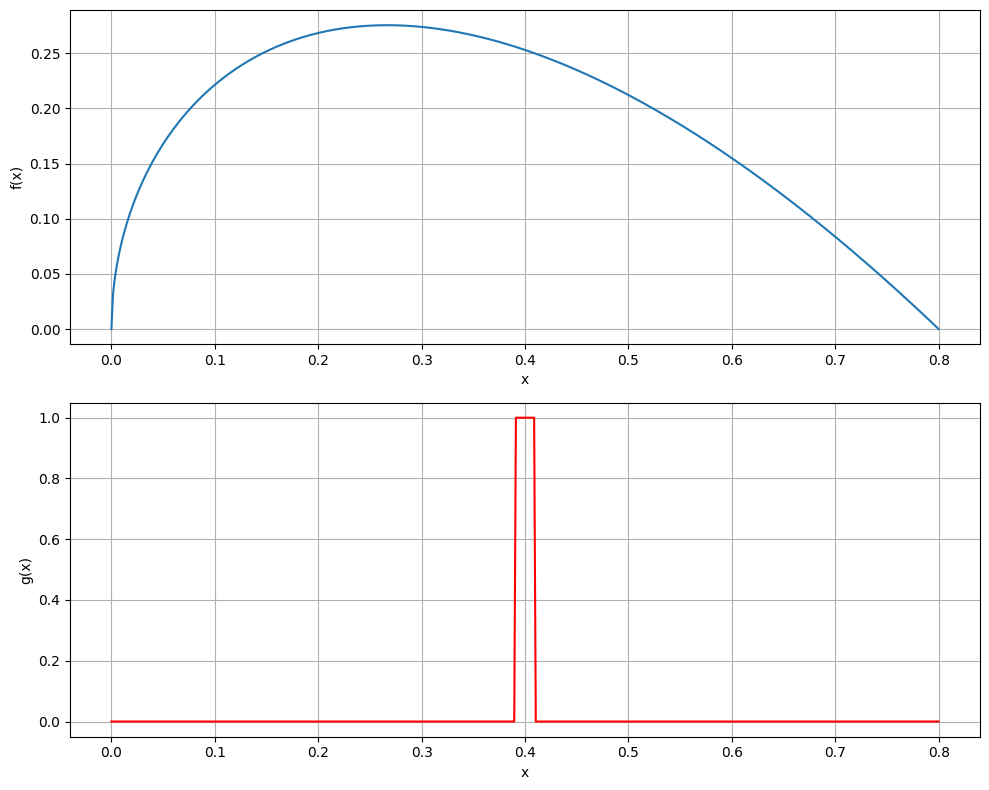

In [1]:
import scipy.integrate as intgrt
import numpy as np
import math as mth
import matplotlib.pyplot as plt


LENGTH = 0.8    # l
STIFFNES = 0.05 # N - жесткость
DENSITY = 0.02  # rho - плотность
ALPHA = 0.39    
BETA = 0.41     

A = mth.sqrt( STIFFNES / DENSITY ) # скорость волны 

c = 1           # начальная скорость


def f(x): 
    return (LENGTH - x) * np.sqrt(x)

def g(x):
    return np.where((x >= ALPHA) & (x <= BETA), c, 0)

x = np.linspace(0, LENGTH, 500)

# Вычисляем значения функций
f_values = f(x)
g_values = g(x)

# Создаем фигуру и оси для графиков
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 8))

# Строим график f(x)
ax1.plot(x, f_values, label='$f(x)$')
ax1.set_xlabel('x')
ax1.set_ylabel('f(x)')
ax1.grid(True)


# Строим график g(x)
ax2.plot(x, g_values, label='$g(x)$', color='red')
ax2.set_xlabel('x')
ax2.set_ylabel('g(x)')
ax2.grid(True)

# Настройка отображения
plt.tight_layout()
plt.show()

# Задание 2 

Найти $A_n$ $\omega_{n}$ при $n=1,2,3,4,5$

Частота гармоник - демонстрирует нам с какой частатой колеблеться каждая волна. Как она зависит от каждого показателя: 

l - чем больше длина тем ниже будет частота                                                                 
n - чем больше количество гармоник тем больше буедет частота                                        
a - скокорость с которой будет двигаться струна



$$\omega_{n} = \frac{n \pi}{l} \sqrt{\frac{N}{\rho}}$$

In [2]:
def w_n(num): 
    return (mth.pi * num / LENGTH) * mth.sqrt( STIFFNES / DENSITY )

Данный коэфициент демонстрирует как начальное отклонение и то как оно влияет на отображение по отношению к синусоиде 

$$a_{n} = \frac{2}{l} \int_{0}^{l} f(x) \cdot sin\left( \frac{\pi n x}{l} \right) dx $$

In [3]:
def a_n(num):
    return 2/LENGTH * intgrt.quad(lambda x: f(x) * mth.sin( ( mth.pi * num * x ) / LENGTH ) , 0, LENGTH )[0]

Данный коэфициент демонстрирует как начальная скорость влияет на n-ую гармонику

$$b_{n} = \frac{2}{\pi n a} \int_{0}^{l} g(x) \cdot sin\left( \frac{\pi n x}{l} \right) dx$$

In [4]:
def b_n(num):
    return (2 / mth.pi * num * A) * intgrt.quad(lambda x: g(x) * mth.sin( ( mth.pi * num * x ) / LENGTH ), 0, LENGTH, points=[ALPHA, BETA])[0]

формула амплитуды

$$A_n=\sqrt{a_n + b_n}$$

In [ ]:
def A_n(num):
    return mth.sqrt(a_n(num) ** 2 + b_n(num)**2)

In [10]:
print(f"{'n':^5} | {'ω_n':^15} | {'a_n':^15} | {'b_n':^15} | {'A_n':^15}")
print("-" * 80)

for n in range(1, 6):
    w = round(w_n(n), 4)
    a = round(a_n(n), 4)
    b = round(b_n(n), 4)
    A = round(A_n(n), 4)
    print(f"{n:^5} | {w:^15} | {a:^15} | {b:^15} | {A:^15}")


  n   |       ω_n       |       a_n       |       b_n       |       A_n      
--------------------------------------------------------------------------------
  1   |     6.2091      |     0.2802      |     0.1086      |     0.3005     
  2   |     12.4182     |     0.0649      |      -0.0       |     0.0649     
  3   |     18.6274     |     0.0376      |     -0.0652     |     0.0753     
  4   |     24.8365     |     0.0218      |       0.0       |     0.0218     
  5   |     31.0456     |     0.0161      |     0.1161      |     0.1172     


# Задание 3

💀АНИМАЦИЯ💀

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

x = np.linspace(0, LENGTH, 500)
t = np.linspace(0, 2 * np.pi / w_n(1), 100)

fig, axs = plt.subplots(2, 3, figsize=(18, 8))
fig.suptitle('Движение струны для разных гармоник', fontsize=16)

# Удаляем последний subplot в нижнем ряду
fig.delaxes(axs[1, 2])

def init():
    for n in range(1, 6):
        row = (n-1) // 3
        col = (n-1) % 3
        if n <= 5:
            axs[row, col].set_title(f'Гармоника {n}')
            axs[row, col].set_xlabel('x')
            axs[row, col].set_ylabel('u(x, t)')
            axs[row, col].set_xlim(0, 1)
            axs[row, col].set_ylim(-1, 1)
    # Инициализация общего графика
    axs[1, 2] = fig.add_subplot(2, 3, 6)
    axs[1, 2].set_title('Все гармоники')
    axs[1, 2].set_xlabel('x')
    axs[1, 2].set_ylabel('u(x, t)')
    axs[1, 2].set_xlim(0, 1)
    axs[1, 2].set_ylim(-1, 1)
    return []

def animate(i):
    frames = []
    for n in range(1, 6):
        row = (n-1) // 3
        col = (n-1) % 3
        if n <= 5:
            axs[row, col].clear()
            axs[row, col].set_title(f'Гармоника {n}')
            axs[row, col].set_xlabel('x')
            axs[row, col].set_ylabel('u(x, t)')
            axs[row, col].set_xlim(0, 1)
            axs[row, col].set_ylim(-1, 1)
            
            u = A_n(n) * np.sin(w_n(n) * t[i]) * np.sin((np.pi * n * x) / LENGTH)
            line, = axs[row, col].plot(x, u, 'b')
            frames.append(line)
    
    # Обновление общего графика
    axs[1, 2].clear()
    axs[1, 2].set_title('Все гармоники')
    axs[1, 2].set_xlabel('x')
    axs[1, 2].set_ylabel('u(x, t)')
    axs[1, 2].set_xlim(0, 1)
    axs[1, 2].set_ylim(-1, 1)
    
    total_u = np.zeros_like(x)
    for n in range(1, 6):
        u = A_n(n) * np.sin(w_n(n) * t[i]) * np.sin((np.pi * n * x) / LENGTH)
        total_u += u
        axs[1, 2].plot(x, u,)
    
    return frames

ani = animation.FuncAnimation(fig, animate, frames=len(t), init_func=init, blit=True, interval=50)

plt.close()
HTML(ani.to_jshtml())